In [1]:


import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import cv2

import warnings
warnings.filterwarnings('ignore')

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/dog-emotion/Dog Emotion/labels.csv
/kaggle/input/dog-emotion/Dog Emotion/angry/RD5aAnVTw8o3DkFJau05786rKeNnu6669.jpg
/kaggle/input/dog-emotion/Dog Emotion/angry/GJPO15yVhfpRlKldjSQSgVCqyHnFDU562.jpg
/kaggle/input/dog-emotion/Dog Emotion/angry/GXPcKwsOEQqqtRaIq8w0zFQCMUbFx6977.jpg
/kaggle/input/dog-emotion/Dog Emotion/angry/b3avIrjGsN1ROEAisS6KZdRNCHHkBP96.jpg
/kaggle/input/dog-emotion/Dog Emotion/angry/HffWubqROvueGYHhItQjdvPVXrJaCi485.jpg
/kaggle/input/dog-emotion/Dog Emotion/angry/TFGusnnlFxzh3Sa76kH6hsK4EY6vMB88.jpg
/kaggle/input/dog-emotion/Dog Emotion/angry/uyR1pgXRIT4ahYoMAgnT0nEbpf4iP7601.jpg
/kaggle/input/dog-emotion/Dog Emotion/angry/cLGnIHimbKDPhslP2BeBGcMIzNdsmh837.jpg
/kaggle/input/dog-emotion/Dog Emotion/angry/LhMue7C04hS016B1SsDON8uMCz6hp1504.jpg
/kaggle/input/dog-emotion/Dog Emotion/angry/eNA8tpkDuU1glbLzPiD1HFWbiYyxtm508.jpg
/kaggle/input/dog-emotion/Dog Emotion/angry/tuzq9xrKK7buri97Z1PezghM6BWeR9254.jpg
/kaggle/input/dog-emotion/Dog Emotion/angry/h2iFIBr

"This dataset consists of images of dogs with labels indicating their emotional state: angry, happy, relaxed, or sad. The images were collected from various online sources and manually annotated by me."

"Number of Images: The dataset includes 4000 images of dogs in total, with 1000 images for each emotion category (angry, happy, relaxed, sad)."

https://www.kaggle.com/datasets/danielshanbalico/dog-emotion

In [2]:

import tensorflow as tf 
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization, Flatten, LeakyReLU, Dense, Dropout
import matplotlib.pyplot as plt 
from tensorflow.keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau

![](https://assets-global.website-files.com/5d7b77b063a9066d83e1209c/616b35e3dcd432047dd02ea5_uYLdnVpAfjC3DC7eWJM2xWyQin_dbVcak0JlRpd7S2bAkdylh-9JITWttww3Wq8fKI56Tl3_v7Y-aVh4nKgl4mZl4ZvcoUIViQRJhBBSw2cpC087oc2iZYvBytr8o1ks1FY1LQxh%3Ds0.png)https://www.v7labs.com/blog/transfer-learning-guide

#What Emotions Can Dogs Feel?

"The bulk of emotions that dogs experience are the five core emotions that we humans experience: fear, anger, disgust, joy and sadness. In addition, dogs can feel more nuanced emotions like excitement, distress, contentment, anxiety, shyness, anticipation, and even love."

https://www.eastvalleyanimal.com/do-dogs-experience-emotions-like-humans/#:~:text=The%20bulk%20of%20emotions%20that,%2C%20anticipation%2C%20and%20even%20love.

In [3]:
#We don't have train/test so let's see how  it works

train_path = "/kaggle/input/dog-emotion/Dog Emotion"
test_path = "/kaggle/input/dog-emotion/Dog Emotion"

In [4]:
#Code by Hitesh Kumar https://www.kaggle.com/hitzz97/emotion-detection

x = plt.imread("/kaggle/input/dog-emotion/Dog Emotion/relaxed/0ul4hqrEYeDM1NwY5XG7LvdWkabiRR271.jpg")
x.shape

(375, 500, 3)

In [5]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255.)

In [6]:
#Code by Hitesh Kumar https://www.kaggle.com/hitzz97/emotion-detection

train = datagen.flow_from_directory(train_path,target_size=(48,48),class_mode="sparse", seed=1, color_mode="grayscale", batch_size=128)
test = datagen.flow_from_directory(test_path,target_size=(48,48),class_mode="sparse", seed=1, color_mode="grayscale", batch_size=128)

Found 4000 images belonging to 4 classes.
Found 4000 images belonging to 4 classes.


In [7]:
dir(train)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__next__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_filepaths',
 '_flow_index',
 '_get_batches_of_transformed_samples',
 '_keras_api_names',
 '_keras_api_names_v1',
 '_set_index_array',
 'allowed_class_modes',
 'batch_index',
 'batch_size',
 'class_indices',
 'class_mode',
 'classes',
 'color_mode',
 'data_format',
 'directory',
 'dtype',
 'filenames',
 'filepaths',
 'image_data_generator',
 'image_shape',
 'index_array',
 'index_generator',
 'interpolation',
 'keep_aspect_ratio',
 'labels',
 'lock',
 'n',
 'next',
 'num_classes',
 'on_epoch_end',
 'reset',
 'sample_weight',
 'samples',
 'save_format',
 'save_prefix',

In [8]:


print(train.class_indices)
emotion_dict = {0: "angry", 1: "sad", 2: "relaxed", 3: "happy"}

{'angry': 0, 'happy': 1, 'relaxed': 2, 'sad': 3}


In [9]:

x, y = train.next()
print(x.shape, y.shape)
train.reset()

(128, 48, 48, 1) (128,)


In [10]:

model = Sequential([
    Conv2D(32, (3,3), input_shape=(48,48,1),padding="same"),
    LeakyReLU(),
    Conv2D(32, (3,3), padding="same"),
    LeakyReLU(),
    BatchNormalization(),
    MaxPooling2D((2,2)),
    Dropout(0.2),
    
    Conv2D(64,(3,3),padding="same"),
    LeakyReLU(),
    Conv2D(64,(3,3), padding="same"),
    LeakyReLU(),
    BatchNormalization(),
    MaxPooling2D((2,2)),
    Dropout(0.3),
    
    Conv2D(128,(3,3),padding="same"),
    LeakyReLU(),
    Conv2D(128,(3,3), padding="same"),
    LeakyReLU(),
    Conv2D(128,(3,3), padding="same"),
    LeakyReLU(),
    BatchNormalization(),
    MaxPooling2D((2,2)),
    Dropout(0.4),
    
    Flatten(),
#     tf.keras.layers.GlobalAveragePooling2D(),
#     Dropout(0.4),
    
    Dense(128, activation='relu'),
    Dropout(0.4),
#     Dense(64, activation="relu"),
    
    Dense(len(train.class_indices), activation="softmax")
])
model.summary()
model.compile(
    optimizer=tf.keras.optimizers.RMSprop(learning_rate=1e-3), 
    loss='sparse_categorical_crossentropy', 
    metrics=['accuracy']
)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 48, 48, 32)        320       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 48, 48, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 48, 48, 32)        9248      
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 48, 48, 32)        0         
                                                                 
 batch_normalization (BatchN  (None, 48, 48, 32)       128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 24, 24, 32)       0         
 )                                                      

In [11]:


net = Sequential(name='DCNN')

net.add(
    Conv2D(
        filters=64,
        kernel_size=(5,5),
        input_shape=(48, 48, 1),
        activation='elu',
        padding='same',
        kernel_initializer='he_normal',
        name='conv2d_1'
    )
)
net.add(BatchNormalization(name='batchnorm_1'))
net.add(
    Conv2D(
        filters=64,
        kernel_size=(5,5),
        activation='elu',
        padding='same',
        kernel_initializer='he_normal',
        name='conv2d_2'
    )
)
net.add(BatchNormalization(name='batchnorm_2'))

net.add(MaxPooling2D(pool_size=(2,2), name='maxpool2d_1'))
net.add(Dropout(0.4, name='dropout_1'))

net.add(
    Conv2D(
        filters=128,
        kernel_size=(3,3),
        activation='elu',
        padding='same',
        kernel_initializer='he_normal',
        name='conv2d_3'
    )
)
net.add(BatchNormalization(name='batchnorm_3'))
net.add(
    Conv2D(
        filters=128,
        kernel_size=(3,3),
        activation='elu',
        padding='same',
        kernel_initializer='he_normal',
        name='conv2d_4'
    )
)
net.add(BatchNormalization(name='batchnorm_4'))

net.add(MaxPooling2D(pool_size=(2,2), name='maxpool2d_2'))
net.add(Dropout(0.4, name='dropout_2'))

net.add(
    Conv2D(
        filters=256,
        kernel_size=(3,3),
        activation='elu',
        padding='same',
        kernel_initializer='he_normal',
        name='conv2d_5'
    )
)
net.add(BatchNormalization(name='batchnorm_5'))
net.add(
    Conv2D(
        filters=256,
        kernel_size=(3,3),
        activation='elu',
        padding='same',
        kernel_initializer='he_normal',
        name='conv2d_6'
    )
)
net.add(BatchNormalization(name='batchnorm_6'))

net.add(MaxPooling2D(pool_size=(2,2), name='maxpool2d_3'))
net.add(Dropout(0.5, name='dropout_3'))

net.add(Flatten(name='flatten'))

net.add(
    Dense(
        128,
        activation='elu',
        kernel_initializer='he_normal',
        name='dense_1'
    )
)
net.add(BatchNormalization(name='batchnorm_7'))

net.add(Dropout(0.6, name='dropout_4'))

net.add(
    Dense(
        4,#ATTEntion 4 classes dense 4
        activation='softmax',
        name='out_layer'
    )
)

net.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

net.summary()

Model: "DCNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 48, 48, 64)        1664      
                                                                 
 batchnorm_1 (BatchNormaliza  (None, 48, 48, 64)       256       
 tion)                                                           
                                                                 
 conv2d_2 (Conv2D)           (None, 48, 48, 64)        102464    
                                                                 
 batchnorm_2 (BatchNormaliza  (None, 48, 48, 64)       256       
 tion)                                                           
                                                                 
 maxpool2d_1 (MaxPooling2D)  (None, 24, 24, 64)        0         
                                                                 
 dropout_1 (Dropout)         (None, 24, 24, 64)        0      

In [12]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [13]:


early_stopping = EarlyStopping(
    monitor='val_accuracy',
    min_delta=0.00005,
    patience=11,
    verbose=1,
    restore_best_weights=True,
)

lr_scheduler = ReduceLROnPlateau(
    monitor='val_accuracy',
    factor=0.5,
    patience=7,
    min_lr=1e-7,
    verbose=1,
)

callbacks = [
    early_stopping,
    lr_scheduler,
]

#Epochs

In [14]:
model.fit(train, validation_data=test, epochs=20, callbacks=callbacks)

Epoch 1/20


2024-07-04 10:15:48.329820: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


32/32 [==============================] - 65s 2s/step - loss: 2.2114 - accuracy: 0.2655 - val_loss: 1.3937 - val_accuracy: 0.2500 - lr: 1.0000e-04
Epoch 2/20
32/32 [==============================] - 31s 977ms/step - loss: 1.4682 - accuracy: 0.2855 - val_loss: 1.3930 - val_accuracy: 0.2640 - lr: 1.0000e-04
Epoch 3/20
32/32 [==============================] - 31s 989ms/step - loss: 1.3975 - accuracy: 0.2968 - val_loss: 1.4190 - val_accuracy: 0.2500 - lr: 1.0000e-04
Epoch 4/20
32/32 [==============================] - 31s 975ms/step - loss: 1.3793 - accuracy: 0.2862 - val_loss: 1.5931 - val_accuracy: 0.2500 - lr: 1.0000e-04
Epoch 5/20
32/32 [==============================] - 31s 969ms/step - loss: 1.3753 - accuracy: 0.3013 - val_loss: 1.7518 - val_accuracy: 0.2500 - lr: 1.0000e-04
Epoch 6/20
32/32 [==============================] - 31s 968ms/step - loss: 1.3617 - accuracy: 0.3257 - val_loss: 1.6672 - val_accuracy: 0.2500 - lr: 1.0000e-04
Epoch 7/20
32/32 [==============================] - 31

In [15]:
model.save('63.h5')

In [16]:


x,y = test.next()
preds = model.predict(x)
idx = np.argmax(preds, axis = 1)
# idx.shape
print('correct prediction:', np.sum((y == idx)*1)/128)

4/4 [==============================] - 0s 5ms/step
correct prediction: 0.3203125


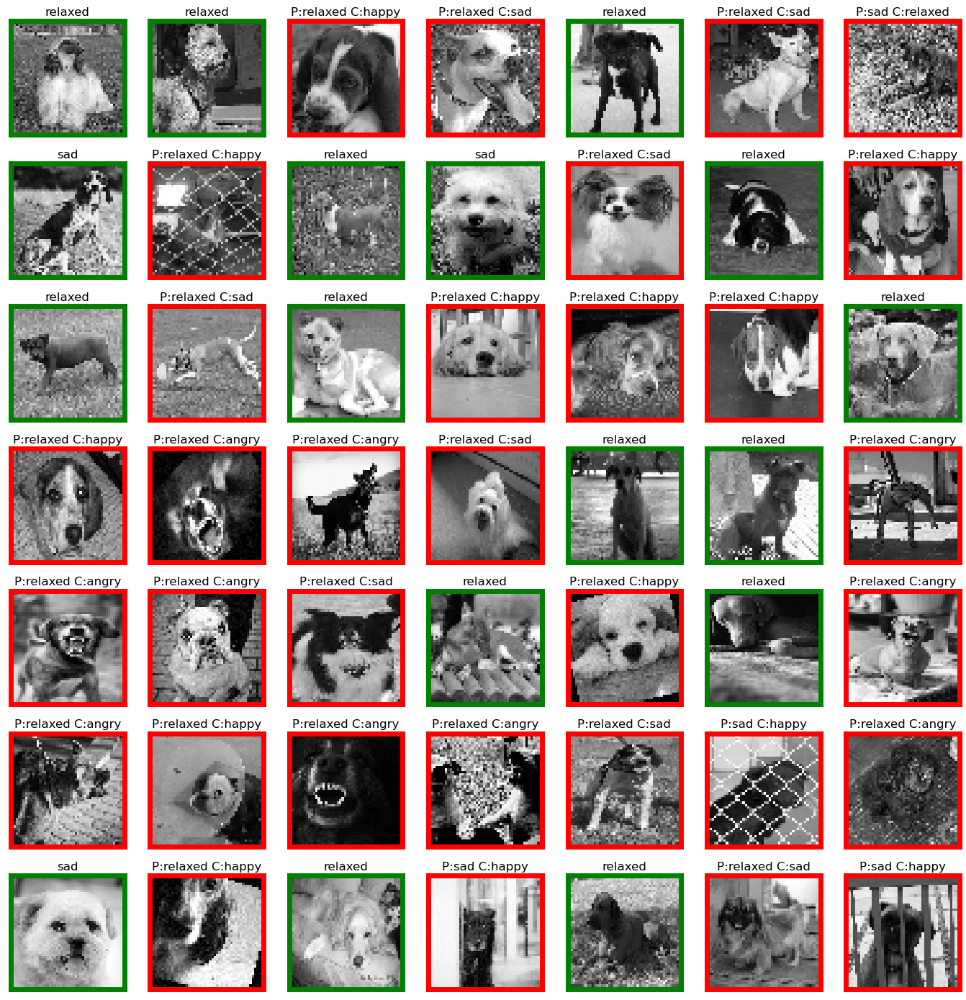

In [17]:


fig = plt.figure(1, (14, 14))

k = 0
for j in range(49):
    px = x[j]
    k += 1
    ax = plt.subplot(7, 7, k)
    ax.imshow(px, cmap='gray')
    ax.set_xticks([])
    ax.set_yticks([])
    
    if  emotion_dict[y[j]] == emotion_dict[idx[j]]:
        for axis in ['top','bottom','left','right']:
            ax.spines[axis].set_linewidth(5)
            ax.spines[axis].set_color('green')
        ax.set_title(emotion_dict[idx[j]])

    else:
        for axis in ['top','bottom','left','right']:
            ax.spines[axis].set_linewidth(5)
            ax.spines[axis].set_color('red')
        ax.set_title('P:'+emotion_dict[idx[j]]+" C:"+emotion_dict[y[j]])
    plt.tight_layout()

#Let's try another approach to see more Dog's Images

In [18]:
import tensorflow as tf 
import numpy as np
import os
import matplotlib.pyplot as plt 
tf.__version__

'2.11.0'

In [19]:
Name0=os.listdir('../input/dog-emotion/Dog Emotion')
Name=sorted(Name0)
n=len(Name)
N=list(range(n))
normal_mapping=dict(zip(Name,N)) 
reverse_mapping=dict(zip(N,Name)) 

#Prepare ImageDataGenerator

In [20]:
#https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator

img_generator = tf.keras.preprocessing.image.ImageDataGenerator(
                            #rotation_range=90,
                            brightness_range=(0.5,1), 
                            #shear_range=0.2, 
                            #zoom_range=0.2,
                            channel_shift_range=0.2,
                            horizontal_flip=False,
                            vertical_flip=False,
                            rescale=1./255,
                            validation_split=0.3)

In [21]:
#Stpete Ishii https://www.kaggle.com/code/stpeteishii/transfer-learning-for-manga-facial-expressions

root_dir = '../input/dog-emotion/Dog Emotion'

img_generator_flow_train = img_generator.flow_from_directory(
    directory=root_dir,
    target_size=(224, 224),
    batch_size=32,
    shuffle=True,
    subset="training")

img_generator_flow_valid = img_generator.flow_from_directory(
    directory=root_dir,
    target_size=(224, 224),
    batch_size=32,
    shuffle=True,
    subset="validation")

Found 2800 images belonging to 4 classes.
Found 1200 images belonging to 4 classes.


#Visualize a batch of images

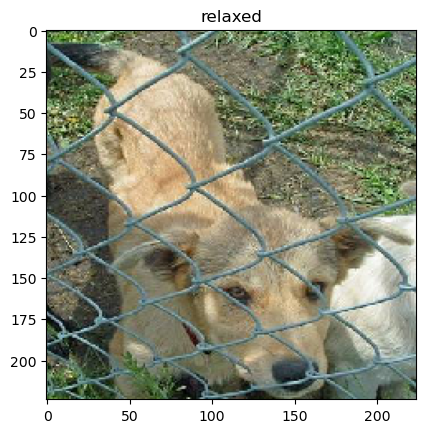

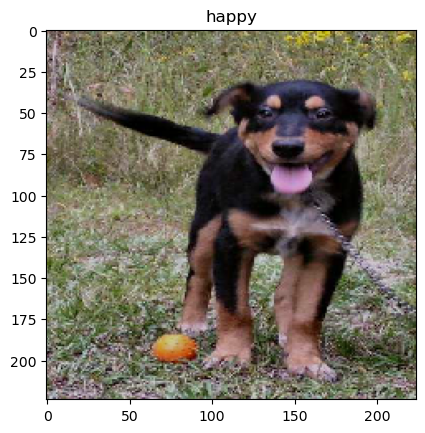

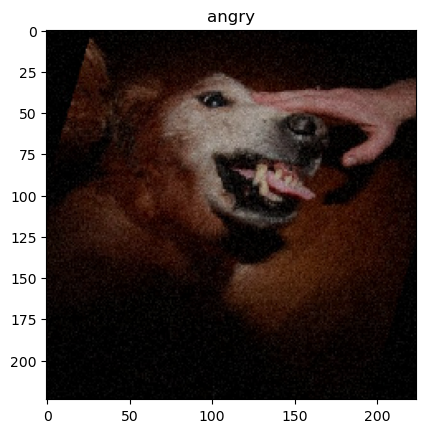

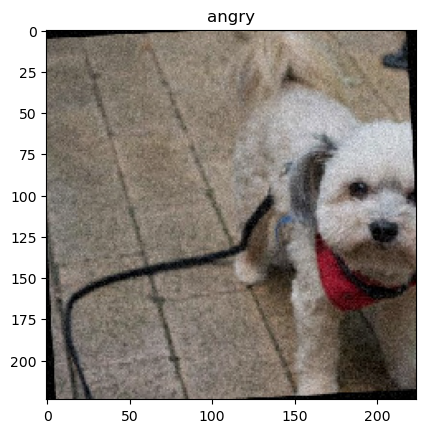

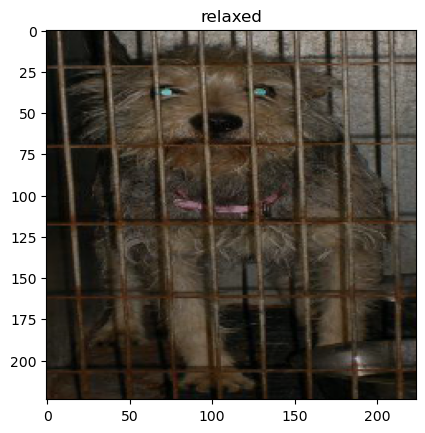

...

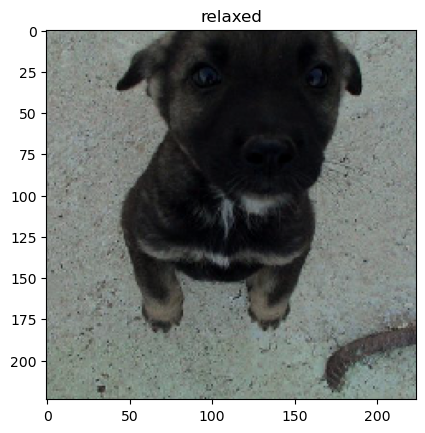

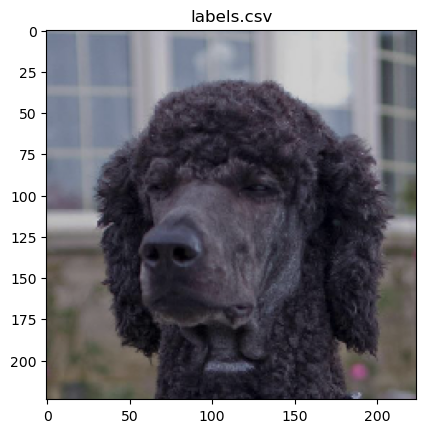

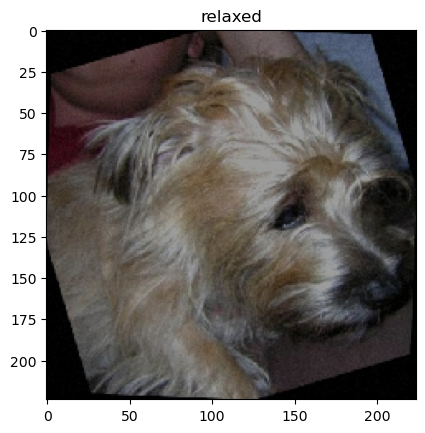

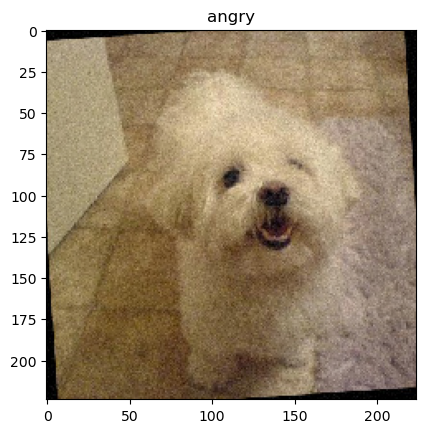

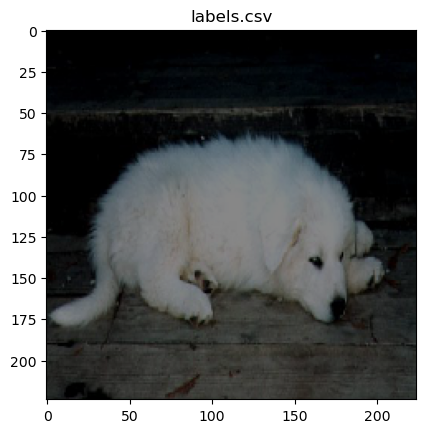

In [22]:
#Stpete Ishii https://www.kaggle.com/code/stpeteishii/transfer-learning-for-manga-facial-expressions

imgs, labels = next(iter(img_generator_flow_train))
for img, label in zip(imgs, labels):
    value=np.argmax(label)
    plt.imshow(img)
    plt.title(reverse_mapping[value])
    plt.show()

#Transfer Learning

#Import a pretrained model

In [23]:
#https://www.tensorflow.org/api_docs/python/tf/keras/applications/InceptionV3

base_model = tf.keras.applications.InceptionV3(input_shape=(224,224,3),
                                               include_top=False,
                                               weights = "imagenet"
                                               )

87910968/87910968 [==============================] - 0s 0us/step


#Set the weights of the imported model

In [24]:
base_model.trainable = False

#Create a Model

In [25]:
model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(4, activation="softmax")#4 classes
])

In [26]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 2, 2, 2048)       0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 8192)              0         
                                                                 
 dense_2 (Dense)             (None, 4)                 32772     
                                                                 
Total params: 21,835,556
Trainable params: 32,772
Non-trainable params: 21,802,784
_________________________________________________________________


#Compile model

In [27]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = 0.0001),
              loss = tf.keras.losses.CategoricalCrossentropy(),
              metrics = [tf.keras.metrics.CategoricalAccuracy()])

#Train model. Epochs

In [28]:
model.fit(img_generator_flow_train, 
          validation_data=img_generator_flow_valid, 
          steps_per_epoch=10, epochs=100) 

Epoch 1/100
10/10 [==============================] - 19s 1s/step - loss: 2.2640 - categorical_accuracy: 0.2531 - val_loss: 2.1904 - val_categorical_accuracy: 0.2817
Epoch 2/100
10/10 [==============================] - 11s 1s/step - loss: 1.8689 - categorical_accuracy: 0.3531 - val_loss: 1.8821 - val_categorical_accuracy: 0.3158
Epoch 3/100
10/10 [==============================] - 11s 1s/step - loss: 1.7592 - categorical_accuracy: 0.3313 - val_loss: 1.7472 - val_categorical_accuracy: 0.3667
Epoch 4/100
10/10 [==============================] - 11s 1s/step - loss: 1.7964 - categorical_accuracy: 0.3500 - val_loss: 1.6170 - val_categorical_accuracy: 0.3858
Epoch 5/100
10/10 [==============================] - 11s 1s/step - loss: 1.5943 - categorical_accuracy: 0.4125 - val_loss: 1.5674 - val_categorical_accuracy: 0.3942
Epoch 6/100
10/10 [==============================] - 11s 1s/step - loss: 1.5740 - categorical_accuracy: 0.4062 - val_loss: 1.5303 - val_categorical_accuracy: 0.4050
Epoch 7/10

#Visualize accuracy and loss

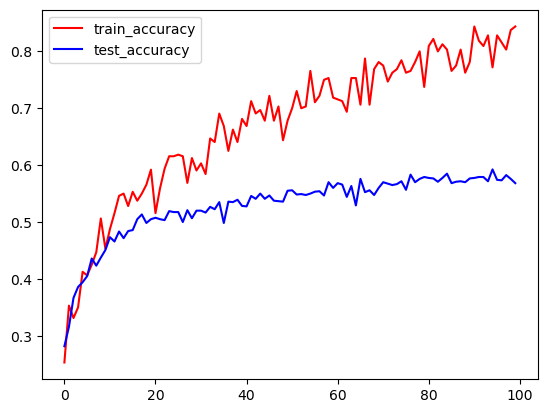

In [29]:
#Stpete Ishii https://www.kaggle.com/code/stpeteishii/transfer-learning-for-manga-facial-expressions

# Visualise train / Valid Accuracy
plt.plot(model.history.history["categorical_accuracy"], c="r", label="train_accuracy")
plt.plot(model.history.history["val_categorical_accuracy"], c="b", label="test_accuracy")
plt.legend(loc="upper left")
plt.show()

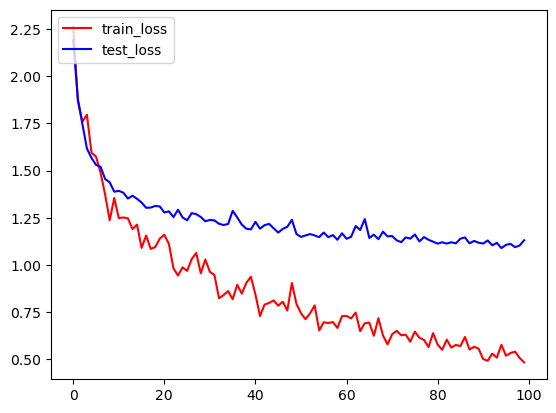

In [30]:
#Stpete Ishii https://www.kaggle.com/code/stpeteishii/transfer-learning-for-manga-facial-expressions

# Visualise train / Valid Loss
plt.plot(model.history.history["loss"], c="r", label="train_loss")
plt.plot(model.history.history["val_loss"], c="b", label="test_loss")
plt.legend(loc="upper left")
plt.show()

#Interpretation with Grad Cam

#Create imgs and labels

In [31]:
imgs, labels = next(iter(img_generator_flow_valid))

In [32]:
#Stpete Ishii https://www.kaggle.com/code/stpeteishii/transfer-learning-for-manga-facial-expressions

for layer in model.layers:
    print(layer.name)

inception_v3
max_pooling2d_7
flatten_1
dense_2


In [33]:
base_model = model.layers[0]

In [34]:
#Stpete Ishii https://www.kaggle.com/code/stpeteishii/transfer-learning-for-manga-facial-expressions

last_conv_layer_name = "mixed10"
classifier_layer_names = [layer.name for layer in model.layers][1:]

In [35]:
#Stpete Ishii https://www.kaggle.com/code/stpeteishii/transfer-learning-for-manga-facial-expressions

# We start by setting up the dependencies we will use

import numpy as np
import tensorflow as tf
from tensorflow import keras

# Display
from IPython.display import Image
import matplotlib.pyplot as plt
import matplotlib.cm as cm

#Make Gradcam Heatmap

In [36]:
#Stpete Ishii https://www.kaggle.com/code/stpeteishii/transfer-learning-for-manga-facial-expressions


# The Grad-CAM algorithm
def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = keras.preprocessing.image.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(
    img_array, base_model, model, last_conv_layer_name, classifier_layer_names):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer
    last_conv_layer = base_model.get_layer(last_conv_layer_name)
    last_conv_layer_model = keras.Model(base_model.inputs, last_conv_layer.output)

    # Second, we create a model that maps the activations of the last conv
    # layer to the final class predictions
    classifier_input = keras.Input(shape=last_conv_layer.output.shape[1:])
    x = classifier_input
    for layer_name in classifier_layer_names:
        x = model.get_layer(layer_name)(x)
    classifier_model = keras.Model(classifier_input, x)

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        # Compute activations of the last conv layer and make the tape watch it
        last_conv_layer_output = last_conv_layer_model(img_array)
        tape.watch(last_conv_layer_output)
        # Compute class predictions
        preds = classifier_model(last_conv_layer_output)
        top_pred_index = tf.argmax(preds[0])
        top_class_channel = preds[:, top_pred_index]

    # This is the gradient of the top predicted class with regard to
    # the output feature map of the last conv layer
    grads = tape.gradient(top_class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    last_conv_layer_output = last_conv_layer_output.numpy()[0]
    pooled_grads = pooled_grads.numpy()
    for i in range(pooled_grads.shape[-1]):
        last_conv_layer_output[:, :, i] *= pooled_grads[i]

    # The channel-wise mean of the resulting feature map
    # is our heatmap of class activation
    heatmap = np.mean(last_conv_layer_output, axis=-1)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
    return heatmap

#Predict

In [37]:
#Stpete Ishii https://www.kaggle.com/code/stpeteishii/transfer-learning-for-manga-facial-expressions

# Print what the top predicted class is
preds = model.predict(imgs)
pred_labels = tf.argmax(preds, axis = -1)

print("Prediction output:", preds)
print("Predicted label:", pred_labels)

1/1 [==============================] - 1s 1s/step
Prediction output: [[6.73424155e-02 1.14338972e-01 3.85461539e-01 4.32857096e-01]
 [7.40490481e-02 3.45748305e-01 5.39201975e-01 4.10006382e-02]
 [3.88735026e-01 2.09650323e-02 1.45051345e-01 4.45248574e-01]
 [1.56682640e-01 7.42960605e-04 2.83521712e-01 5.59052646e-01]
 [5.40733859e-02 6.76761985e-01 2.45376959e-01 2.37876661e-02]
 [1.66866496e-01 4.91363145e-02 3.78464423e-02 7.46150732e-01]
 [4.55066770e-01 9.37926322e-02 1.67430878e-01 2.83709735e-01]
 [3.75076264e-01 4.96012896e-01 1.08560540e-01 2.03502513e-02]
 [1.66998297e-01 1.20594248e-03 1.31427555e-03 8.30481470e-01]
 [1.77283771e-02 3.25135738e-02 1.95774794e-01 7.53983259e-01]
 [6.10402375e-02 1.38707459e-03 2.27696709e-02 9.14802969e-01]
 [5.86890578e-01 2.73657404e-03 4.04834934e-03 4.06324446e-01]
 [8.59560192e-01 4.18340880e-03 1.56160898e-03 1.34694681e-01]
 [2.81733964e-02 1.37413060e-02 1.19600829e-03 9.56889272e-01]
 [1.89676939e-03 2.02736934e-04 1.64741545e-03 9.

#Heatmap

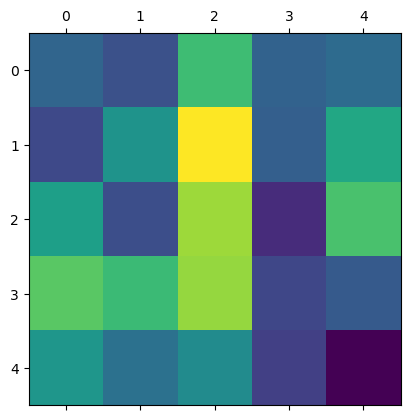

In [38]:
#Stpete Ishii https://www.kaggle.com/code/stpeteishii/transfer-learning-for-manga-facial-expressions

# Generate class activation heatmap
heatmaps = []

for img in imgs:
    heatmap = make_gradcam_heatmap(
    tf.expand_dims(img,axis=0),
        base_model, model, 
        last_conv_layer_name, 
        classifier_layer_names
  )
    heatmaps.append(heatmap)


# Display heatmap
plt.matshow(heatmaps[0])
plt.show()

#Predicted label and heatmap

Predicted label: sad
True label: sad


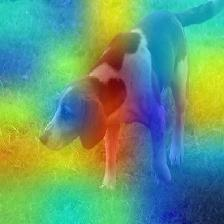

Predicted label: relaxed
True label: relaxed


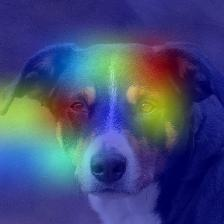

Predicted label: sad
True label: angry


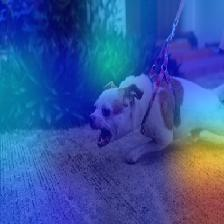

Predicted label: sad
True label: sad


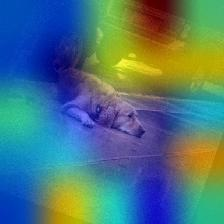

Predicted label: happy
True label: happy


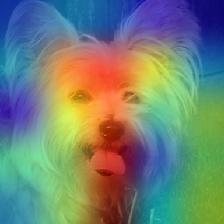

Predicted label: sad
True label: sad


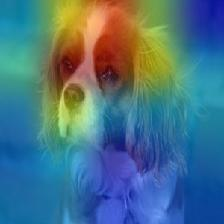

Predicted label: angry
True label: angry


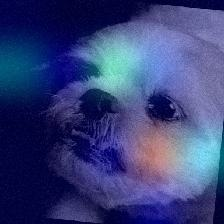

Predicted label: happy
True label: happy


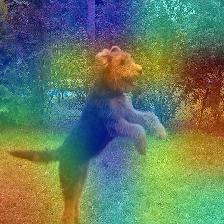

Predicted label: sad
True label: sad


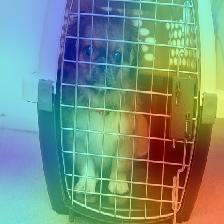

Predicted label: sad
True label: sad


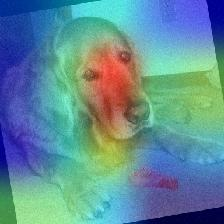

Predicted label: sad
True label: sad


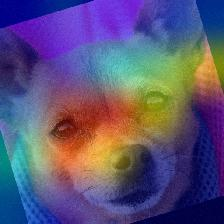

Predicted label: angry
True label: angry


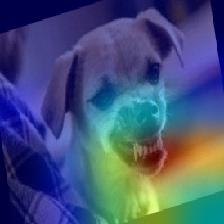

Predicted label: angry
True label: angry


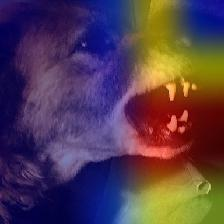

Predicted label: sad
True label: angry


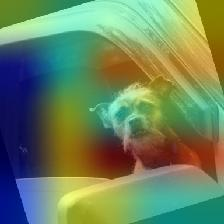

Predicted label: sad
True label: sad


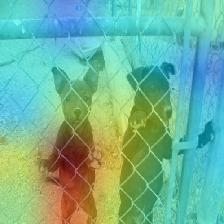

Predicted label: happy
True label: happy


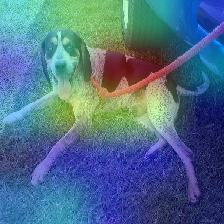

Predicted label: relaxed
True label: relaxed


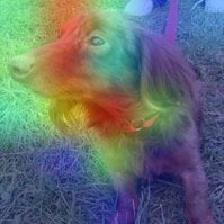

Predicted label: relaxed
True label: relaxed


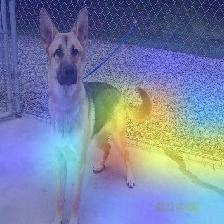

Predicted label: relaxed
True label: angry


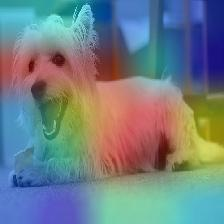

Predicted label: relaxed
True label: relaxed


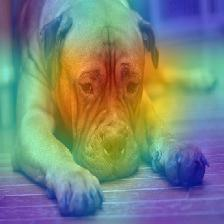

Predicted label: relaxed
True label: relaxed


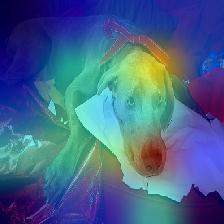

Predicted label: sad
True label: happy


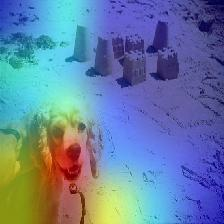

Predicted label: angry
True label: happy


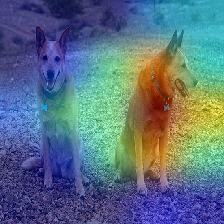

Predicted label: relaxed
True label: happy


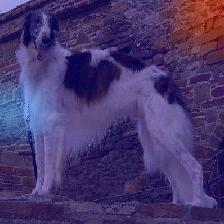

Predicted label: sad
True label: relaxed


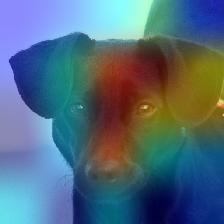

Predicted label: relaxed
True label: angry


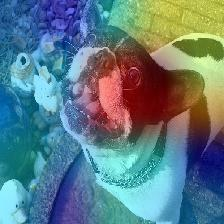

Predicted label: angry
True label: angry


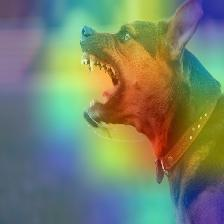

Predicted label: angry
True label: angry


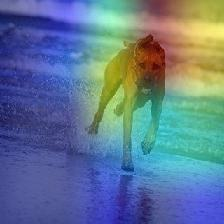

Predicted label: sad
True label: sad


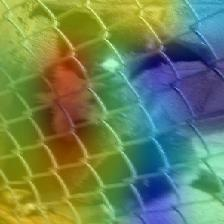

Predicted label: angry
True label: angry


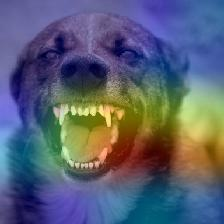

Predicted label: relaxed
True label: sad


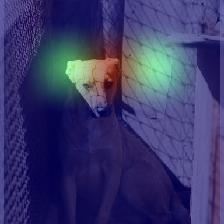

Predicted label: relaxed
True label: happy


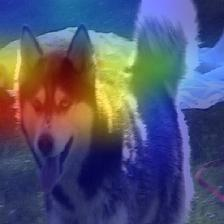

In [39]:
#Stpete Ishii https://www.kaggle.com/code/stpeteishii/transfer-learning-for-manga-facial-expressions

from pathlib import Path

for img, pred_label, true_label, heatmap in zip(imgs, pred_labels, labels, heatmaps): 
    # We rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # We use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # We use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # We create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * 0.003 + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    save_path = "saved_img.jpg"
    superimposed_img.save(save_path)

    # Display Grad CAM
    pred_file_path = np.argmax(img_generator_flow_valid.labels == pred_label)
    pred_label_name = Path(img_generator_flow_valid.filepaths[pred_file_path]).parent.name

    true_file_path = np.argmax(img_generator_flow_valid.labels == tf.argmax(true_label))
    true_label_name = Path(img_generator_flow_valid.filepaths[true_file_path]).parent.name

    print("Predicted label:",pred_label_name)
    print("True label:", true_label_name)

    display(Image(save_path))

#Classification Report

In [40]:
#Stpete Ishii https://www.kaggle.com/code/stpeteishii/transfer-learning-for-manga-facial-expressions

LABEL=[]
for item in labels:
    LABEL+=[np.argmax(item)]
print(LABEL)

[3, 2, 0, 3, 1, 3, 0, 1, 3, 3, 3, 0, 0, 0, 3, 1, 2, 2, 0, 2, 2, 1, 1, 1, 2, 0, 0, 0, 3, 0, 3, 1]


In [41]:
PRED=pred_labels.numpy().tolist()
print(PRED)

[3, 2, 3, 3, 1, 3, 0, 1, 3, 3, 3, 0, 0, 3, 3, 1, 2, 2, 2, 2, 2, 3, 0, 2, 3, 2, 0, 0, 3, 0, 2, 2]


In [42]:
from sklearn.metrics import classification_report
print(classification_report(LABEL, PRED))

              precision    recall  f1-score   support

           0       0.86      0.60      0.71        10
           1       1.00      0.43      0.60         7
           2       0.50      0.83      0.62         6
           3       0.67      0.89      0.76         9

    accuracy                           0.69        32
   macro avg       0.76      0.69      0.67        32
weighted avg       0.77      0.69      0.68        32



In [43]:
print(reverse_mapping)

{0: 'angry', 1: 'happy', 2: 'labels.csv', 3: 'relaxed', 4: 'sad'}


#Acknowledgement



Dataset Author: Daniel Shan Balico https://www.kaggle.com/datasets/danielshanbalico/dog-emotion